# Datasets EDA

In [1]:
import os
from pathlib import Path

SEED = 42
DATASETS_DIR = Path(os.getcwd()).parent / "data" / "datasets"
DATASETS_DIR

WindowsPath('d:/Projects/synthetic-images-detection/data/datasets')

### General Viz Functions

In [2]:
import math
import pandas as pd
import concurrent.futures
from PIL import Image, ImageStat
import plotly.express as px
from tqdm import tqdm


def get_width(img: Image.Image):
    return img.width


def get_height(img: Image.Image):
    return img.height


def get_lum(img: Image.Image):
    return ImageStat.Stat(img.convert('L')).mean[0]


def process_df(df, fp_col='fp', inplace=False, max_workers=None, **col_and_func):
    def pipe(fp: Path):
        row = dict()
        with Image.open(fp) as img:
            for new_col, func in col_and_func.items():
                row[new_col] = func(img)
        return row
    data = df if inplace else df.copy()
    paths = data[fp_col].tolist()
    with concurrent.futures.ThreadPoolExecutor(max_workers=max_workers) as ex:
        vals = list(tqdm(ex.map(pipe, paths), total=len(paths)))
    new_df = pd.DataFrame(vals, index=data.index)
    df = pd.concat([data, new_df], axis=1)
    return df


def plot_resolution_distribution(
    df,
    width_col: str = 'width',
    height_col: str = 'height',
    nbins: int = 10
):
    fig = px.density_heatmap(
        df,
        x=width_col,
        y=height_col,
        nbinsx=nbins,
        nbinsy=nbins,
        marginal_x="histogram",
        marginal_y="histogram",
        title="2D Resolution Distribution (Square Heatmap)",
        labels={width_col: "Width (px)", height_col: "Height (px)"},
        color_continuous_scale=px.colors.sequential.Magma
    )
    return fig


def plot_luminance_distribution(df, lum_col='mean_luminance', extra_col=None, bins=50):
    return (px.histogram(
        df, x=lum_col, color=extra_col, nbins=bins, labels={lum_col: 'Average Luminance'}, title='Image Luminance Distribution')
        .update_layout(barmode='overlay')
        .update_traces(opacity=0.75)
    )


def sample_image_grid(paths, N, size=(1024, 1024), random_state=SEED):
    fps = paths.sample(N, random_state=random_state).tolist()
    grid_size = int(math.sqrt(N))
    with concurrent.futures.ThreadPoolExecutor() as ex:
        imgs = list(tqdm(ex.map(lambda fp: Image.open(fp), fps), total=N, desc="Loading"))
    widths = [img.width for img in imgs]
    heights = [img.height for img in imgs]
    cell_w, cell_h = min(widths), min(heights)
    cells = []
    for img in tqdm(imgs, total=N, desc="Resizing & Padding"):
        ratio = min(cell_w / img.width, cell_h / img.height)
        new_w, new_h = int(img.width * ratio), int(img.height * ratio)
        thumb = img.resize((new_w, new_h))
        cell = Image.new('RGB', (cell_w, cell_h), (255, 255, 255))
        cell.paste(thumb, ((cell_w - new_w) // 2, (cell_h - new_h) // 2))
        cells.append(cell)
    grid = Image.new('RGB', (cell_w * grid_size, cell_h * grid_size), (255, 255, 255))
    for idx, cell in enumerate(cells):
        x = (idx % grid_size) * cell_w
        y = (idx // grid_size) * cell_h
        grid.paste(cell, (x, y))
    return grid.resize(size), fps


def save_csv(df: pd.DataFrame, fp: Path) -> None:
    assert "model_name" in df.columns
    assert "fp" in df.columns
    assert "label" in df.columns
    assert "height" in df.columns
    assert "width" in df.columns
    assert "mean_luminance" in df.columns

    df["fp"] = df["fp"].apply(lambda x: str(Path(x).relative_to(DATASETS_DIR)))
    df.to_csv(fp, index=False)

## AI vs Human Generated Dataset
The dataset consists of authentic images sampled from the Shutterstock platform across various categories, including a balanced selection where one-third of the images feature humans. These authentic images are paired with their equivalents generated using state-of-the-art generative models. This structured pairing enables a direct comparison between real and AI-generated content, providing a robust foundation for developing and evaluating image authenticity detection systems.

columns:
- `fp`
- `label` - 1 is synthetic, 0 is real image.

In [64]:
def get_ai_vs_human_data() -> pd.DataFrame:
    dir_path = DATASETS_DIR / "ai_vs_human_generated"
    df = pd.read_csv(dir_path / "train.csv", index_col=0)
    df["file_name"] = df["file_name"].apply(lambda x: str(dir_path / x))
    df.rename(columns={"file_name": "fp"}, inplace=True)
    return df

df = get_ai_vs_human_data()
df

,fp,label
0,d:\Projects\synthetic-images-detection\data\da...,1
1,d:\Projects\synthetic-images-detection\data\da...,0
2,d:\Projects\synthetic-images-detection\data\da...,1
3,d:\Projects\synthetic-images-detection\data\da...,0
4,d:\Projects\synthetic-images-detection\data\da...,1
...,...,...
79945,d:\Projects\synthetic-images-detection\data\da...,0
79946,d:\Projects\synthetic-images-detection\data\da...,1
79947,d:\Projects\synthetic-images-detection\data\da...,0
79948,d:\Projects\synthetic-images-detection\data\da...,1


Real Images (label = 1)

Resizing & Padding: 100%|██████████| 16/16 [00:00<00:00, 213.73it/s]


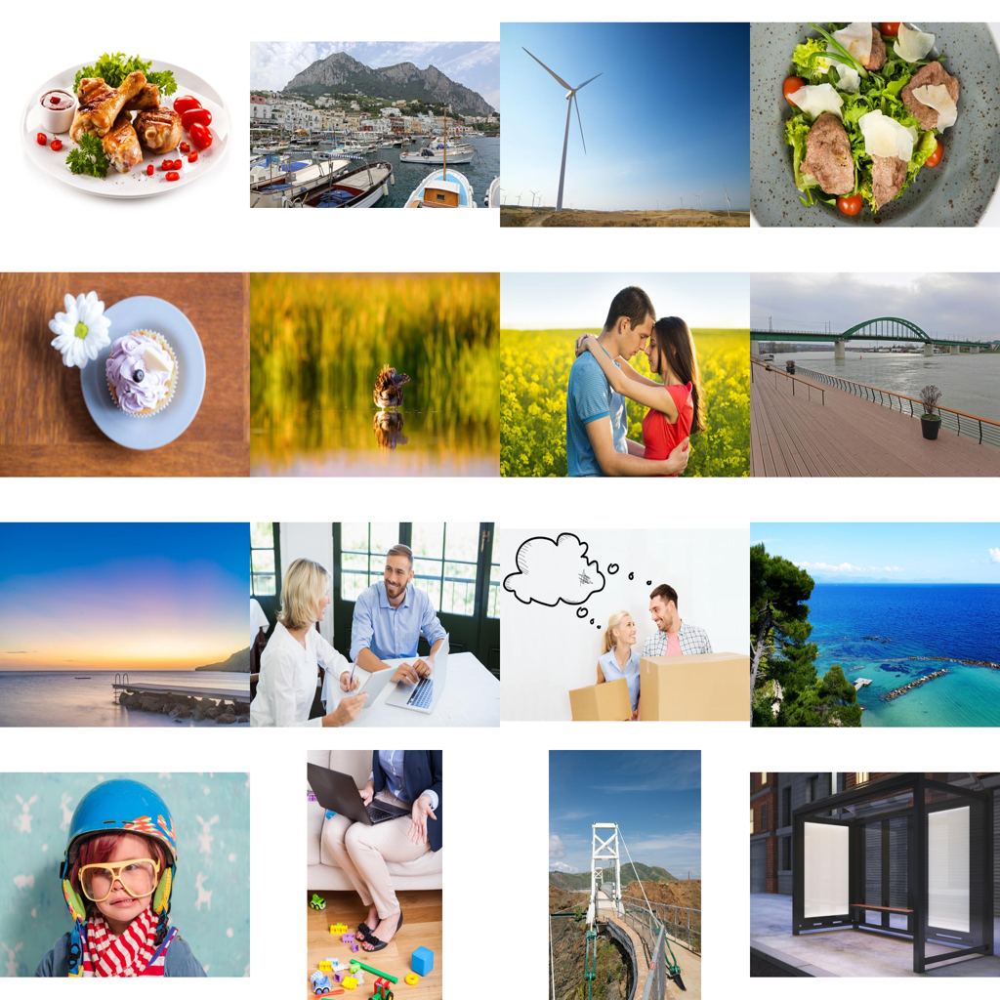

In [65]:
sample_image_grid(df["fp"][df["label"] == 0], 16)[0]

Synthetic Images (label = 1)

Resizing & Padding: 100%|██████████| 16/16 [00:00<00:00, 210.89it/s]


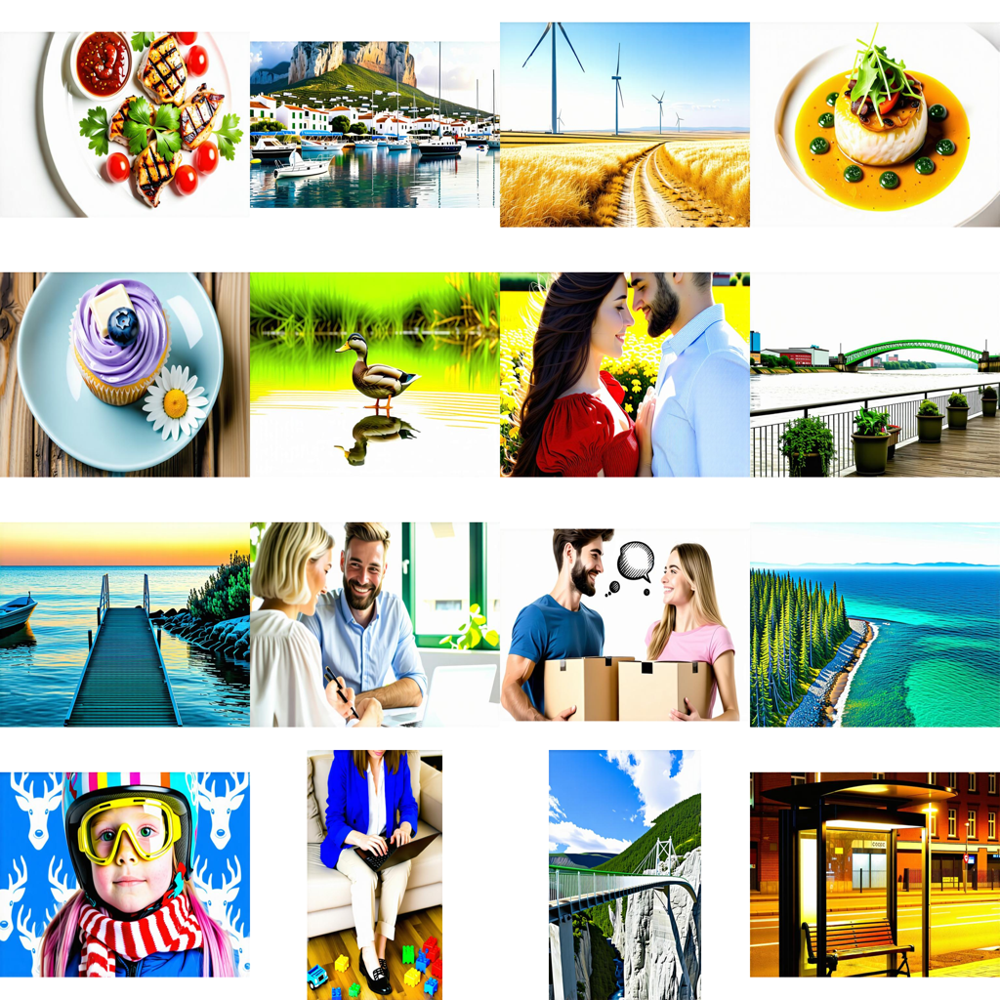

In [66]:
sample_image_grid(df["fp"][df["label"] == 1], 16)[0]

### Смотрим статистики
- Распределение лейблов
- Распредление разрешения
- Распределения яркости

In [67]:
df["label"].value_counts()

label
1    39975
0    39975
Name: count, dtype: int64

Идентичное количество синтетики и реальных изображений.

In [68]:
stat_df = process_df(df, "fp", height=get_height, width=get_width, mean_luminance=get_lum)

100%|██████████| 79950/79950 [01:05<00:00, 1217.23it/s]


Синтетика генерировалась на основание изображений из стока, поэтому рпаспределения резрешений на синтетики и реальных одинакова.

In [69]:
stat_df[["label", "width", "height"]].value_counts()

label  width  height
1      768    512       20899
0      768    512       20899
       512    768        5824
1      512    768        5824
       768    496        2744
                        ...  
       400    768           2
0      336    768           1
       768    128           1
1      336    768           1
       768    128           1
Name: count, Length: 140, dtype: int64

In [70]:
plot_resolution_distribution(stat_df)

Все изображения <1MP, почти все изображения в диапозоне 400-768.

In [74]:
plot_luminance_distribution(stat_df, extra_col="label")

Распределение яркости нормальное, интерсно взглянуть на самые тусклые сэмплы:

Resizing & Padding: 100%|██████████| 4/4 [00:00<00:00, 208.36it/s]


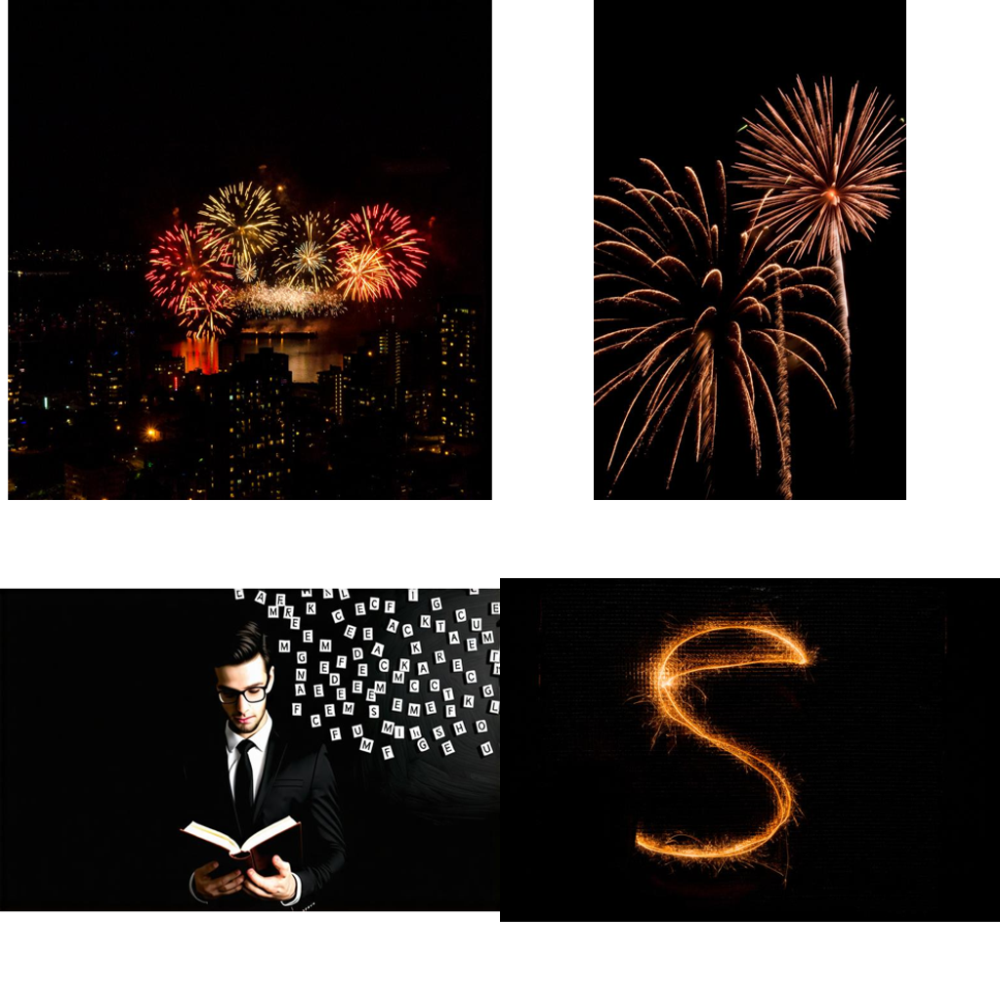

In [75]:
sample_image_grid(stat_df["fp"][stat_df["mean_luminance"] < 30], 4)[0]

Добавить поле `model_name`

In [76]:
import numpy as np

stat_df["model_name"] = np.where(stat_df["label"] == 1, "SDXL", None)

In [77]:
save_csv(stat_df, DATASETS_DIR / "ai_vs_human_generated" / "processed.csv")

## SFHQ-T2I: Synthetic Faces from Text 2 Image models
This dataset consists of 122,726 high quality 1024x1024 curated face images, and was created by creating random prompt strings that were sent to multiple "text to image" models (Flux1.pro, Flux1.dev, Flux1.schnell, SDXL, DALL-E 3) and dropping bad generations using a semi manual curation process.

In [78]:
def get_sfhq_t2i() -> pd.DataFrame:
    dir_path = DATASETS_DIR / "sfhq_t2i"
    df = pd.read_csv(dir_path / "SFHQ_T2I_dataset.csv")
    df["image_filename"] = df["image_filename"].apply(lambda x: str(dir_path / "images" / "images" / x))
    df.rename(columns={"image_filename": "fp", "model_used": "model_name"}, inplace=True)
    return df

df = get_sfhq_t2i()
df

,fp,model_name,text_prompt,configs
0,d:\Projects\synthetic-images-detection\data\da...,DALLE3,Close up image of an 18 month old South Asian ...,"{""size"": ""1024x1024"", ""quality"": ""standard"", ""..."
1,d:\Projects\synthetic-images-detection\data\da...,DALLE3,"A detailed ultra-realistic image, like a film ...","{""size"": ""1024x1024"", ""quality"": ""standard"", ""..."
2,d:\Projects\synthetic-images-detection\data\da...,DALLE3,Create a photorealistic and raw candid cinema ...,"{""size"": ""1024x1024"", ""quality"": ""standard"", ""..."
3,d:\Projects\synthetic-images-detection\data\da...,DALLE3,Render an ultra-realistic portrait of a 33-yea...,"{""size"": ""1024x1024"", ""quality"": ""standard"", ""..."
4,d:\Projects\synthetic-images-detection\data\da...,DALLE3,Create a cinematic movie still of a 67-year-ol...,"{""size"": ""1024x1024"", ""quality"": ""standard"", ""..."
...,...,...,...,...
122721,d:\Projects\synthetic-images-detection\data\da...,SDXL,"Studio portrait of a 47 year old Laos person, ...","{""engine_id"": ""stable-diffusion-xl-1024-v1-0"",..."
122722,d:\Projects\synthetic-images-detection\data\da...,SDXL,A POV shot of a 13 year old West Asian teenage...,"{""engine_id"": ""stable-diffusion-xl-1024-v1-0"",..."
122723,d:\Projects\synthetic-images-detection\data\da...,SDXL,A wide-angle shot of a 16 year old Arctic teen...,"{""engine_id"": ""stable-diffusion-xl-1024-v1-0"",..."
122724,d:\Projects\synthetic-images-detection\data\da...,SDXL,Photograph of a 14 year old Central Asian teen...,"{""engine_id"": ""stable-diffusion-xl-1024-v1-0"",..."


In [79]:
import plotly.express as px

fig = px.bar(df["model_name"].value_counts(), 
             x="count", labels={"index": "Model Name", "model_name": "Count"})
fig

Колладжи примеров по моделям:

DALLE3


Resizing & Padding: 100%|██████████| 4/4 [00:00<00:00, 129.04it/s]


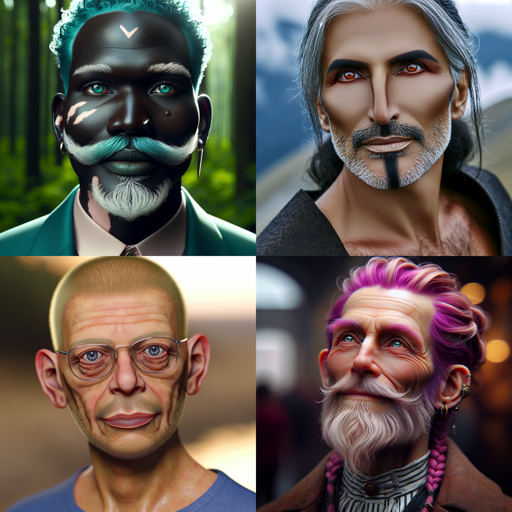

FLUX1_dev


Resizing & Padding: 100%|██████████| 4/4 [00:00<00:00, 148.14it/s]


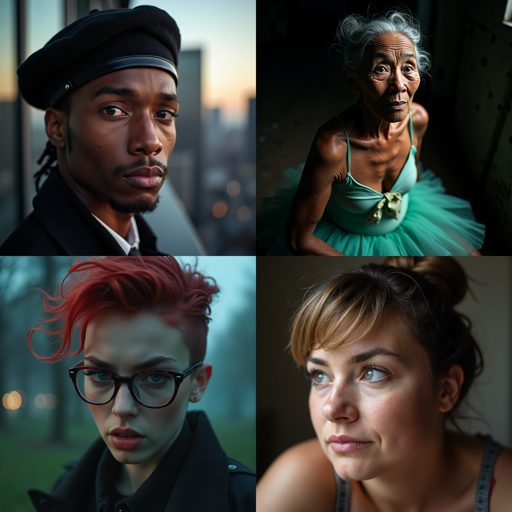

FLUX1_pro


Resizing & Padding: 100%|██████████| 4/4 [00:00<00:00, 142.86it/s]


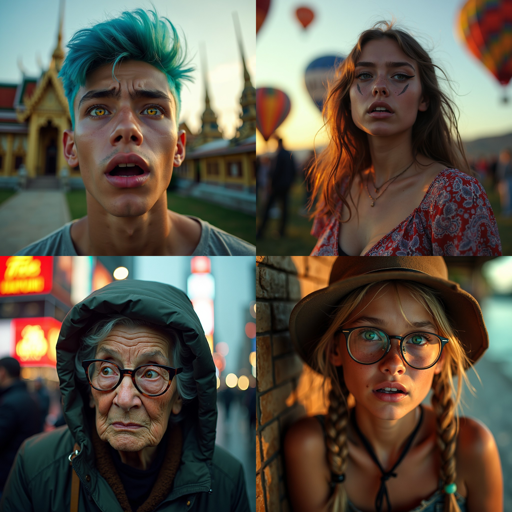

FLUX1_schnell


Resizing & Padding: 100%|██████████| 4/4 [00:00<00:00, 133.33it/s]


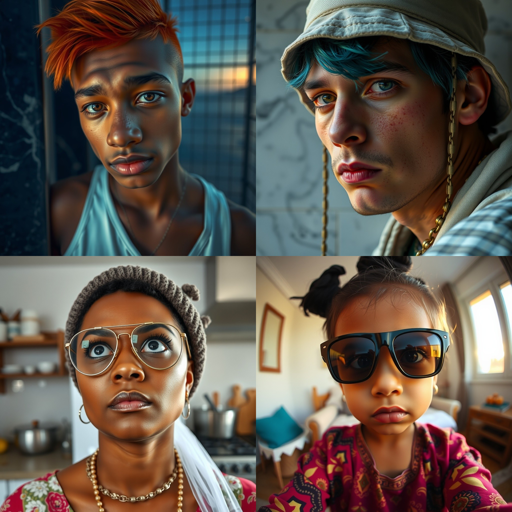

SDXL


Resizing & Padding: 100%|██████████| 4/4 [00:00<00:00, 144.78it/s]


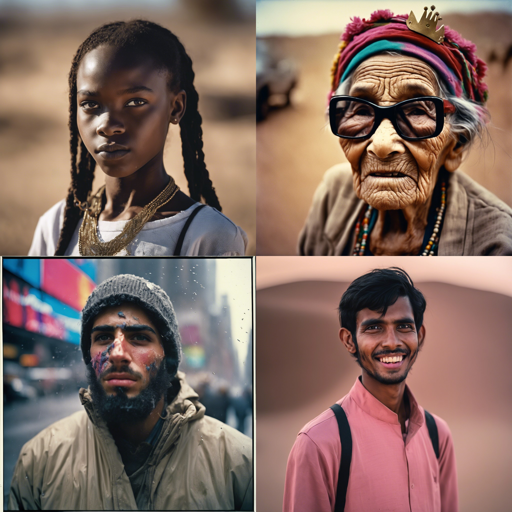

In [80]:
from IPython.display import display

for model_name in np.unique(df.model_name):
    print(model_name)
    display(sample_image_grid(df["fp"][df["model_name"] == model_name], 4, size=(512, 512))[0])

### Смотрим статистики
- Распределение лейблов
- Распредление разрешения
- Распределения яркости

In [81]:
stat_df = process_df(df, "fp", height=get_height, width=get_width, mean_luminance=get_lum)

100%|██████████| 122726/122726 [03:01<00:00, 674.43it/s]


In [82]:
stat_df[["height", "width"]].value_counts()

height  width
1024    1024     122726
Name: count, dtype: int64

In [88]:
plot_luminance_distribution(stat_df, extra_col="model_name")

In [89]:
stat_df["label"] = 1

In [90]:
save_csv(stat_df, DATASETS_DIR / "sfhq_t2i" / "processed.csv")

## SD Faces
Fake Ai generated Human faces

Images in 512x512px resolution were generated using SD 1.5;
Images in 768x768px resolution were generated using SD 2.1;
Images in 1024x1024px resolution were generated using SD XL 1.0;

In [ ]:
# 1. Посмотреть распредлеление лейблов
# 1. Посмотреть распределение разрешений
# 1. Посмотреть яркость / тёмность
# На заметку: Можно вытащить Фичи
# 2. Посмотреть распределение данных / dbscan + sigclip + zero-shot classification
# 3. Разбить на трейн / тест 